In [1]:
import pandas as pd
import numpy as np
import time

import plotly.express as px
import seaborn as sns
from matplotlib import pyplot as plt

import sys

!{sys.executable} -m pip install duckdb-engine

!{sys.executable} -m pip install ipython-sql

import duckdb, sqlalchemy

from sklearn.linear_model import LogisticRegression, LinearRegression

import statsmodels.api as sm

import statsmodels.formula.api as smf


%load_ext sql

%config SqlMagic.autopandas = True
%config SqlMagic.feedback = False
%config SqlMagic.displaycon = False

%sql duckdb:///:memory:

__Introduction:__

As Cornell students in Ithaca, New York, crime alerts are emailed to us on a regular basis. While our college town seems relatively safe, we also wanted to investigate crime in New York state as a whole. For example, New York City has notoriously had high crime rates. So, we first explored which counties in New York have had the highest crime rate in the past 13 years. We found that New York City's 5 counties surpassed New York State's more rural counties in terms of crime rates. We also examined in those counties, which crimes have been committed the most. The top 8 crimes for New York City were Murder, Rape, Robbery, Aggravated Assault, Property Crime, Burglary, Larceny, and Motor Vehicle Theft. Our final analyses led us to our research questions, listed below:
<br>

_Research Questions:_
1. In New York City, are the number of arrests negatively correlated with a violent crime?
2. As the number of drug-related arrests in New York City decreases, will the number of arrests for people in NYC aged 18-24 also decrease?
3. Is race a significant factor in whether or not a perpetrator will get arrested by the NYPD?


For our first research question, we ran a logistic regression on the Number of Arrests and whether or not a crime is violent or non-violent. Our regression generated a coefficient of -8.661e-06 for the Number of Arrests, indicating a decrease in the probability of an arrest being violent as the number of arrests increases. However, we ultimately rejected our hypothesis because we found it to be statistically insignificant, and concluded that the number of arrests are ***not*** negatively correlated with a violent crime.
<br>
<br>
For our second research question, we ran a linear regression on the Number of Drug Arrests and the Number of Arrests for people aged 18-24. Our regression generated a coefficient of  0.8979, showing that as the number of drug arrests increases by 1, the number of arrests for people in NYC aged 18-24 increases by 0.8979. We also found our coefficient to be statistically significant. because our coefficient indicates a positive correlation, we concluded that  as the number of drug-related arrests in New York City decreases, the number of arrests for people in NYC aged 18-24 ***will*** also decrease.
<br>
<br>
For our third research question, we ran a linear regression on the Number of Arrests for each race and the total Number of Arrests in NYC. Our regression generated a coefficient of 4.8607 for the White Hispanic race, indicating an increase in 4.8607 in the total number of arrests as the number of arrests among White Hispanics increases by 1. We found that while the coefficient for the White Hispanic race was statistically significant, the coefficients for the other races were not. Thus, we concluded that race ***is*** a significant factor in whether a perpetrator will get arrested by the NYPD, though it depends on the race. 
<br>
<br>
Lastly, we looked at the demographics of the population arrested for various crimes such as Drug Possession and Assault. We found that White Hispanic people are nearly 2 times more likely to be arrested for a drug-related crime than White people, and Black people are nearly are nearly 4 times more likely to be arrested for a drug-related crime than White people.

__Data Description:__
* The first dataset we used, county_crime, has 14 columns and 21.8K rows. Its data came from the "Index Crimes by County and Agency: Beginning 1990" dataset. Each row represents a crime report submitted between 1990 and 2021 to The Division of Criminal Justice Services by a New York State police or sheriff department. The columns describe the crimes present in that report, such as the county the crimes were committed in, the year, the # of total crimes, the # of violent crimes, the # of murders, etc. The Index Crimes dataset was created by the Division of Criminal Justice Services, and its creation was funded by said department. Furthermore, the Index Crimes dataset was submitted to the FBI under the National Uniform Crime Reporting (UCR) Program, to generate statistics in use for law enforcement across the nation. The data itself may be influenced by which populations are more likely to report a crime to the police, as well as which crimes are more likely to reported. In creating the county_crime dataset, we modified the Index Crimes dataset to exclude the Months Reported column, as we will mainly be focusing on the number and location of various crimes. We also excluded crime reports/rows submitted before 2008 to focus on crime in more recent years, and to accelerate the speed of our data analysis process. Link to the raw source data: https://catalog.data.gov/dataset/index-crimes-by-county-and-agency-beginning-1990
<br><br>_Columns:_ 
* County - Location where the crime was reported.
* Agency - Police Department that reported the crime.
* Year - Year the crime incident was reported.
* Months Reported - Number of months an individual agency reported for the year.
* Index Total - Includes sum of Murder, Rape, Robbery, Aggravated Assault, Burglary, Larceny and Motor Vehicle Theft.
* Violent Total	- Subtotal includes Murder, Rape, Robbery and Aggravated Assault.
* Murder - One count per victim. The willful killing of one human being by another. Excludes deaths caused by negligence, suicide, or justifiable homicides, and attempts to murder, which are classified as assault.
* Rape - One count per victim. Penetration, no matter how slight, of the vagina or anus with any body part or object, or oral penetration by a sex organ of another person, without the consent of the victim.
* Robbery - One count per victim. The taking or attempting to take anything of value from the care, custody, or control of a person or persons by force or threat of force or violence and/or by putting the victim in fear.
* Aggravated Assault - One count per victim. The unlawful attack by one person upon another for the purpose of inflicting severe or aggravated bodily injury. This type of assault is usually accompanied by the use of a weapon or by means likely to produce death or great bodily harm, and also includes attempts to commit murder.
* Property Total - Subtotal includes Burglary, Larceny and Motor Vehicle Theft.
* Burglary - One count per victim. The unlawful entry of a structure to commit a felony or theft. The use of force to gain entry is not required to classify an offense as Burglary.
* Larceny - One count per victim. The unlawful taking, carrying, leading, or riding away of property from the possession or constructive possession of another. It includes crimes such as shoplifting, purse snatching, bicycle thefts, etc., in which no use of force, violence, or fraud occurs. This offense category does not include offenses such as embezzlement, forgery, or bad checks.
* Motor Vehicle Theft - One count per victim. The theft or attempted theft of a motor vehicle, including automobiles, trucks, buses, motorcycles, and snowmobiles.
* Region - Region where the crime was reported. Regions include New York City (Bronx, Kings, New York, Queens, and Richmond counties) and Non-New York City (all other counties).
<br><br>
* Our second dataset, nypd_arrests, has 13 columns and 5.31M rows.  Its data came from the "NYPD Arrests Data (Historic)" dataset. Each row represents a NYPD arrest that took place in NYC. The columns describe the arrests with data such as location, date, and the race, gender, and age of the perpetrator. This dataset was funded by the NYPD and created for two reasons: to allow the public to examine police enforcement activity, and to support efficient policing in NYC. The observed data is manually extracted every quarter and reviewed by the NYPD's Office of Management Analysis and Planning before being posted on the NYPD website. The observed data may be influenced by biases in law enforcement, as discrimination could cause a disproportionate number of minorities to be unfairly arrested. In creating the nypd_arrests dataset, we modified the NYPD Arrests dataset to exclude any columns that did not contain details regarding the date, location, type of crime, or perpetrator of the arrest. We also excluded arrests before 2008 to match the years present in our county_crime dataset. Link to the raw source data: https://data.cityofnewyork.us/Public-Safety/NYPD-Arrest-Data-Year-to-Date-/uip8-fykc
<br><br>_Columns:_
* ARREST_DATE - Exact date of arrest for the reported event.
* OFNS_DESC	- Description of internal classification corresponding with KY code (more general category than PD description).
* ARREST_BORO - Borough of arrest. B(Bronx), S(Staten Island), K(Brooklyn), M(Manhattan), Q(Queens)
* AGE_GROUP	- Perpetrator’s age within a category.
* PERP_SEX - Perpetrator’s sex description.
* PERP_RACE	- Perpetrator’s race description.
* X_COORD_CD - Midblock X-coordinate for New York State Plane Coordinate System, Long Island Zone, NAD 83, units feet (FIPS 3104).
* Y_COORD_CD - Midblock Y-coordinate for New York State Plane Coordinate System, Long Island Zone, NAD 83, units feet (FIPS 3104).
* Latitude - Latitude coordinate for Global Coordinate System, WGS 1984, decimal degrees (EPSG 4326).
* Longitude	- Longitude coordinate for Global Coordinate System, WGS 1984, decimal degrees (EPSG 4326).
* Lon_Lat - The (longitude, latitude) point of the arrest.
* YEAR - The year of the arrest.

__Preregistration Statement(s):__
<br>
In our exploratory data analysis, we saw a surprisingly large number of drug-related arrests in New York City. Thus, we preregistered two hypotheses to further investigate the impact these arrests (which are considered non-violent) have on New Yorkers. 
<br>
<br>
Hypothesis 1: In NYC, people are more likely to be arrested for a non-violent crime than a violent crime.
<br>
<br>
Hypothesis 2: As the number of drug-related arrests in NYC decreases, the number of arrests for people in NYC aged 18-24 will also decrease.

__Data Analysis:__

<br>
Part I: Crime Rates in New York State
<br>
<br>
When discussing crime in New York State, the first region that comes to mind is New York City. Currently home to nearly 8.5 million people, New York City has had a significant history of crime. In 1980, the City saw 1,814 murders, a year dubbed by the New York Times as the “worst year of crime in city history.” Furthermore, during New York's crack cocaine epidemic in 1990, the New York Times reported that New York City had experienced 2,245 homicides, breaking the 1980 record. And now, as the United States sees an uptick in post-pandemic violence, many are quick to call the City an increasingly dangerous place. However, it is also true that the City is much safer than it used to be; Bloomberg states that the City's murder rate has recently dropped to its smallest value in decades, and crime remains at generational lows. Due to these conflicting pressures on crime rates, we wanted to see if New York City indeed had the highest crime rates in New York State. 

Our first step was to sort our county_crime dataset by the highest average number of reported crimes from  2008 to 2021. 

In [2]:
county_crime = pd.read_csv('county_crime.csv')
nypd_arrests = pd.read_csv('nypd_arrests.csv')

average_county_crime_df = county_crime.groupby('County')['Index Total'].mean()
average_county_crime_df = average_county_crime_df.sort_values(ascending = False)
average_county_crime_df = average_county_crime_df.reset_index()
most_crime_counties = average_county_crime_df ['County'].head(5).values.tolist()

We then created a new dataframe, most_county_crime, that contained the top 5 counties with the highest crime rates.

In [3]:
%sql most_county_crime << SELECT * \
FROM county_crime  \
WHERE  County IN ('Kings', 'New York', 'Queens','Bronx', 'Richmond') \
ORDER BY Year ASC

Returning data to local variable most_county_crime


To visualize our results, we created a bar graph of the top 5 counties with the highest crime rates vs. their reported crime rates, averaged over the years 2008 to 2021.

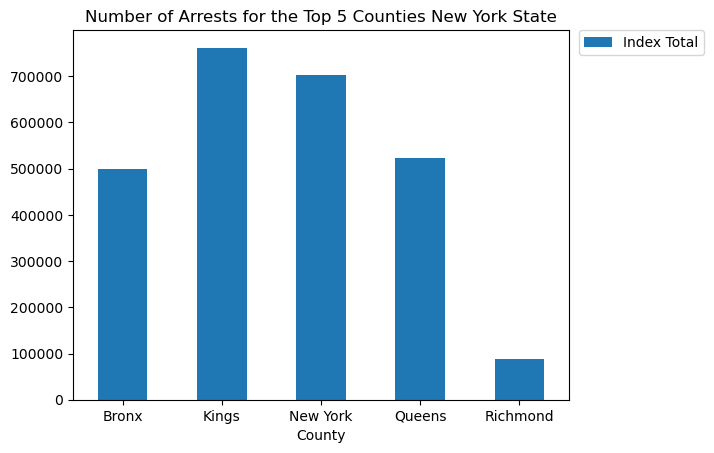

In [4]:
top5_counties_crime = most_county_crime.groupby(['County']).sum()
plot1 = top5_counties_crime.plot.bar(y = 'Index Total', rot=0)
plot1.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('Number of Arrests for the Top 5 Counties New York State')
plt.show()

As expected, the top 5 counties corresponded exactly with NYC's 5 boroughs. Our chart, "Number of Arrests for the Top 5 Counties New York State," shows that across all years from 2008 to 2021, Kings County/Brooklyn has the highest total number of reported crimes.

While our bar graph gives us a good idea of the general locations in New York State where crime is reported most often, we also wanted to look at the specific locations in the City where crime is high. To do this, we used our nypd_arrests dataset, as this dataset contains the exact latitude and longitude of every arrest that took place in New York City from 2008 to 2021. We created a dataframe containing those coordinates, arrest_locations, and plotted the coordinates onto a map of New York City.

We created a heat map below. Note that you can zoom in and out of this map to see New York City in less or greater detail. Also, you may have to rerun this code to see the map.

In [5]:
%sql arrest_locations << SELECT Latitude, Longitude, COUNT(*) AS 'Number of Arrests' \
FROM nypd_arrests \
GROUP BY Latitude, Longitude \
ORDER BY "Number of Arrests" DESC


fig = px.density_mapbox(arrest_locations, lat='Latitude', lon='Longitude', z='Number of Arrests',
                        mapbox_style="stamen-terrain")
 
fig

Returning data to local variable arrest_locations


Looking at the heat map above, arrests are frequent, and appear to be clustered around certain streets. For example, 451 arrests have occured at the intersection near Roosevelt Avenue and Triangle 90. So overall, our map not only reflects the exact locations of NYPD arrests, but also reinforces our conclusion that New York City's boroughs have had high rates of crime.

Part II: Reported Crimes vs. Arrests in New York City

For our next part of our data analysis, we wanted to concentrate on the difference between NYC's most reported crimes, and the types of NYPD arrests. Our results from this section both highlight those differences and showcase the effects of NYC's past policies on crime.

Our first step was to create num_of_arrests, a dataframe with the total number of NYPD arrests each year. 

In [6]:
type_of_crime_drop_cols = ['Year', 'Violent Total', 'Index Total']
counties_by_type_of_crime = top5_counties_crime.drop(type_of_crime_drop_cols, axis = 1)

In [7]:
%sql num_of_arrests << SELECT OFNS_DESC, COUNT(*) AS "Number of Arrests" \
FROM nypd_arrests \
GROUP BY OFNS_DESC \
ORDER BY "Number of Arrests" DESC 

Returning data to local variable num_of_arrests


In [8]:
top_arrests = num_of_arrests.nlargest(10, 'Number of Arrests')
top_crime_arrests = top_arrests['OFNS_DESC'].values.tolist()
print(top_crime_arrests)

['DANGEROUS DRUGS', 'ASSAULT 3 & RELATED OFFENSES', 'OTHER OFFENSES RELATED TO THEFT', 'PETIT LARCENY', 'OTHER STATE LAWS', 'FELONY ASSAULT', 'VEHICLE AND TRAFFIC LAWS', 'DANGEROUS WEAPONS', 'MISCELLANEOUS PENAL LAW', 'CRIMINAL TRESPASS']


We then visualized the top 9 reported crimes across New York City's borroughs, as well as the top 10 types of arrests made by the NYPD in two bar graphs.

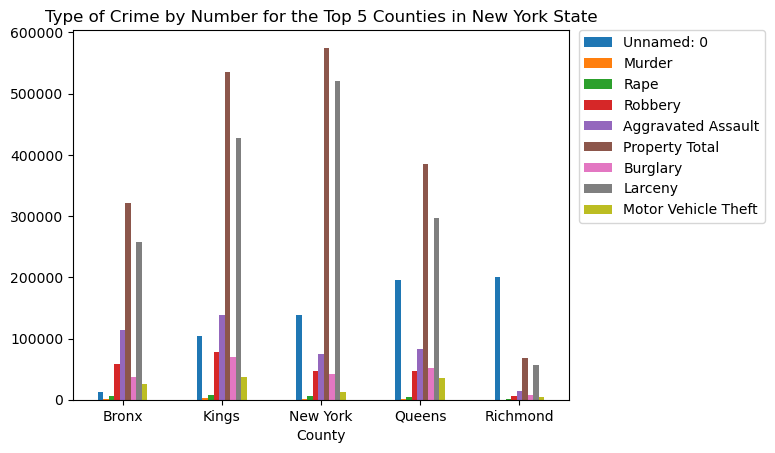

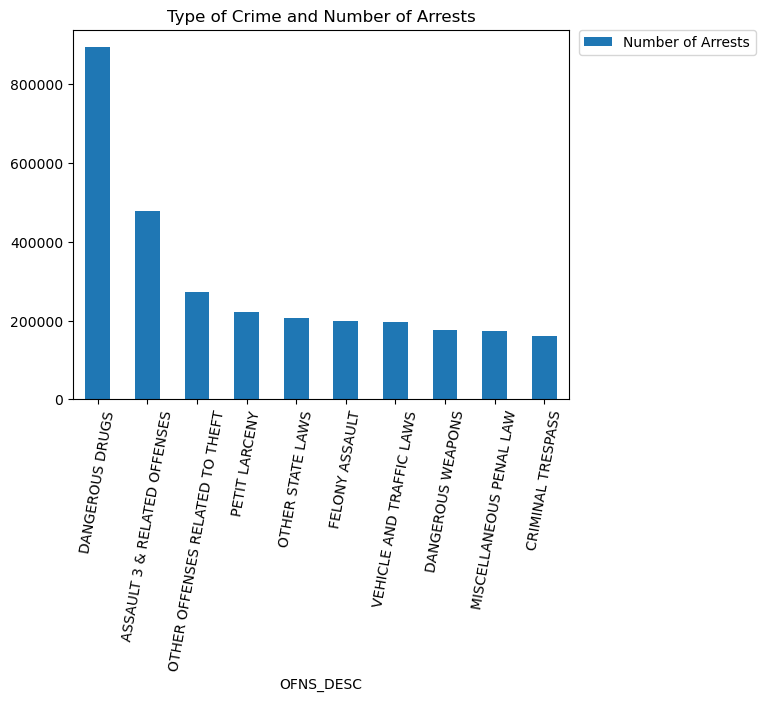

In [26]:
plot2 = counties_by_type_of_crime.plot.bar(rot=0)
plot2.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('Type of Crime by Number for the Top 5 Counties in New York State')
plot3 = top_arrests.plot.bar(x = 'OFNS_DESC', rot=0)
plot3.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('Type of Crime and Number of Arrests')
plt.xticks(rotation = 80)
plt.show()

Our two bar graphs above clearly show the discrepencies between the types of crime New Yorkers report, and the types of crime New Yorkers are arrested for. Breaking down the total number of crimes by type, we see that Property and Larceny Crimes make up most of the reported crimes in New York City. But while some of the crimes with the highest number of arrests are due to highly-reported crimes (i.e. Assault, Petit Larceny), others are not. A key example of this is Dangerous Drugs; Arrests for Drug Possession and/or Sale nearly double or more than double the arrests for all other types of crime. However, it is not even among the top 9 most reported crimes in NYC. Why, one might ask; the reason for this becomes more apparent when one looks at NYC's past policies on crime.
<br><br>
In fact, in the 1990s, former Mayor Rudolph Giuliani was famous for implementing a "broken window" approach to law enforcement. His approach entailed aggressive policing of low-level crimes, leading to a 70 percent increase in misdemeanor arrests in New York City. His belief that small crimes lead to large crimes is still seen today in NYPD's high arrest rates for Dangerous Drugs, as the most common drug charge in NYC is for possession of marijuana, typically a misdemeanor. Whether or not this policy works is another matter, though. Our graphs show that the arrest rate of property crime perpetrators is much lower than the rate at which property crimes are reported. While this policy may work for other misdemeanors, our graphs suggest the crimes that are reported most often are underpoliced. Additionally, crimes such Dangerous Drugs are perhaps being policed too much, without much reward.

Part III: Completing Our Preregistered Analyses and Answering Our Research Questions

So after finding a high number of drug-related arrests in NYC, we wanted to quantify the impact these arrests have on New Yorkers. We formulated our first research question (In New York City, are the number of arrests negatively correlated with a violent crime?) with the knowledge that dangerous drugs is a non-violent crime; if the answer to our question is yes (which means that as the number of arrests increases, it is less likely that the arrest will be for a violent crime and more likely to be for a non-violent crime), then we know that the NYPD's drug-related arrests have contributed to high number of arrests being correlated to a non-violent crime.
<br>
<br>
Thus, we first had to categorize crimes as non-violent and violent. We decided to look at the top 10 crimes that New Yorkers were arrested for, excluding "OTHER STATE LAWS," since that crime has an ambigious definition. For reference, our categorization is listed below:
<br>
<br>Dangerous Drugs: non-violent
<br>Assault: violent
<br>Theft: non-violent
<br>Petite larceny: non-violent
<br>Felony Assault: violent
<br>Vehicle and Traffic Laws: non-violent
<br>Dangerous Weapons: violent
<br>Miscelleanous Penal Law: non-violent
<br>Criminal Trespass: non-violent

<br>
We then created a dataframe, arrests_over_time_2, to count the arrests each year for all the offenses.

In [10]:
%sql arrests_over_time_2 << SELECT YEAR, OFNS_DESC, COUNT(*) AS 'Number of Arrests' \
FROM nypd_arrests \
WHERE OFNS_DESC IN ('DANGEROUS DRUGS', 'ASSAULT 3 & RELATED OFFENSES',\
'OTHER OFFENSES RELATED TO THEFT', 'PETIT LARCENY',\
'FELONY ASSAULT', 'VEHICLE AND TRAFFIC LAWS', 'DANGEROUS WEAPONS',\
'MISCELLANEOUS PENAL LAW', 'CRIMINAL TRESPASS')\
GROUP BY YEAR, OFNS_DESC \
ORDER BY "Number of Arrests" DESC

Returning data to local variable arrests_over_time_2


Next, we created a column of binary variables, if_violent, where we marked an violent offense as 1, and a non-violent offense as 0. 

In [11]:
if_violent = arrests_over_time_2['OFNS_DESC'].isin(['ASSAULT 3 & RELATED OFFENSES','FELONY ASSAULT', 'DANGEROUS WEAPONS'])
arrests_over_time_2['if_violent'] = if_violent.astype(int)

Third, we ran a logistic regression to find if the number of arrests are negatively correlated with a violent crime.

In [12]:
X = arrests_over_time_2[['Number of Arrests']]
y = arrests_over_time_2[['if_violent']].values.ravel()
smlog = sm.Logit(y,sm.add_constant(X)).fit()
smlog.summary()

Optimization terminated successfully.
         Current function value: 0.638822
         Iterations 5


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  123
Model:                          Logit   Df Residuals:                      121
Method:                           MLE   Df Model:                            1
Date:                Mon, 21 Nov 2022   Pseudo R-squ.:                0.004952
Time:                        22:04:54   Log-Likelihood:                -78.575
converged:                       True   LL-Null:                       -78.966
Covariance Type:            nonrobust   LLR p-value:                    0.3765
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -0.4674      0.288     -1.623      0.105      -1.032       0.097
Number of Arrests -8.661e-06   1.02e-05     -0.849      0.396   -2.87e-05    1.13e-05
=====================================================================================
"""

As seen above, our first logistic regression generated a coefficient of -8.661e-06 for the Number of Arrests. Thus, we would expect a decrease in the probability of an arrest being violent as the number of arrests increases, due to a negative cofficient. Yet it is also important to examine the quantity of the coefficient. Our coefficient is extremely close to zero, which suggests that the number of arrests has a minimal/no effect on whether an arrest is violent or non-violent. This is further validated by the p-value for that variable (0.396). A 0.396 p-value is much higher than the usual p-value threshold (0.05) for a statistically significant coefficient. If our p-value was 0.05, there would be only a 5% chance that our coefficient is wrong. However, since our p-value is 0.398, there is a nearly 40% chance that we would've gotten our results, given that the number of arrests is ***not*** negatively correlated with a violent crime. As a result, it is likely that the number of arrests in NYC is ***not*** negatively correlated to whether the crime for those arrests is violent.

Following our first research question, we then wanted to investigate how drug-related arrests impacts our age group: 18-24 year olds. Thus, we came up with our 2nd research question: As the number of drug-related arrests in New York City decreases, will the number of arrests for people in New York City aged 18-24 also decrease?

We first created two dataframes, drugs and ages, which contain information about both drug-related arrests, and arrests for 18-24 year olds in NYC.

In [13]:
%sql drugs << SELECT YEAR, COUNT(*) AS 'Number of Drug Arrests' \
FROM nypd_arrests \
WHERE OFNS_DESC == 'DANGEROUS DRUGS'\
GROUP BY YEAR\
ORDER BY YEAR ASC

%sql ages << SELECT YEAR, COUNT(*) AS 'Number of Arrests'  \
FROM nypd_arrests \
WHERE AGE_GROUP == '18-24'\
GROUP BY YEAR\
ORDER BY YEAR ASC

Returning data to local variable drugs
Returning data to local variable ages


We then made a visualization of drug-related arrests and arrests for 18-24 year olds in NYC over time.

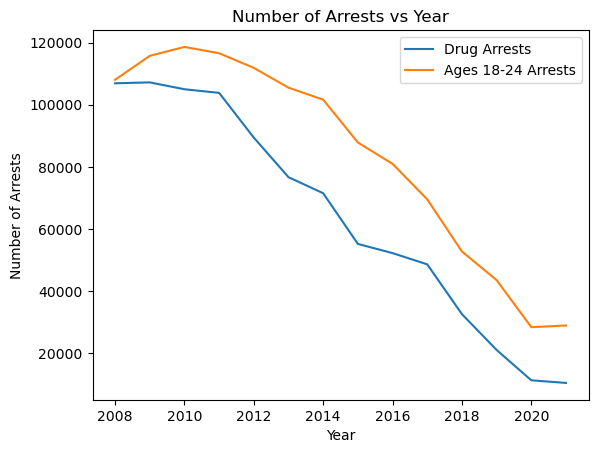

In [14]:
plt.plot(drugs['YEAR'], drugs['Number of Drug Arrests'])
plt.plot(ages['YEAR'], ages['Number of Arrests'])
plt.xlabel('Year')
plt.ylabel('Number of Arrests')
plt.legend(['Drug Arrests', 'Ages 18-24 Arrests'])
plt.title('Number of Arrests vs Year')
plt.show()

So from our previous analysis, we've seen that in New York City, the highest number of arrests were due to drug arrests. We've also explored that from 2008 and 2021, the number of drug arrests has decreased. Additionally, in society, there is an assumption that mostly young adults are involved with drug usage. Thus, for our linear regression, we wanted to explore if as the number of drug arrests in NYC decreases, the number of people aged between 18 and 24 arrested in NYC will decrease as well. Our hypothesis was that these incidents are positively correlated. In the graph above named " Number of Arrests vs Year" shows the number of drug arrests and number of arrests for ages 18-24 between the years 2008 and 2020. By plotting both these we wanted to explore in general if they follow a similar trend. Looking at the graph, we can see that they both follow a similar, which means as both number of drug arrests and number of arrests for people in NYC aged 18-24 decreases over time. However, we know that just plotting these numbers is not enough to prove our hypothesis. To test our hypothesis and see the relationship between the variables we've decided to perform a linear regression. In our linear regression, we've chosen our X variable as number of drug arrests and our y variable as the number of arrests for people in NYC aged 18-24. The code below shows how we did our linear regression analysis and the results resulting from our analysis:

In [15]:
X = drugs[["Number of Drug Arrests"]]
y = ages[["Number of Arrests"]]
tuples = list(zip(drugs['Number of Drug Arrests'], ages["Number of Arrests"]))
combined = pd.DataFrame(tuples, columns=['Drug Arrests','18-24 Arrests'])
m1 = LinearRegression().fit(combined[['Drug Arrests']],combined[['18-24 Arrests']])
yhat = m1.predict(combined[['Drug Arrests']])
X = sm.add_constant(X) 
model2 = sm.OLS(y,X).fit()
model2.summary()

/anaconda3/envs/info2950/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=14



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      Number of Arrests   R-squared:                       0.941
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     191.7
Date:                Mon, 21 Nov 2022   Prob (F-statistic):           9.67e-09
Time:                        22:04:54   Log-Likelihood:                -145.28
No. Observations:                  14   AIC:                             294.6
Df Residuals:                      12   BIC:                             295.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                   2.637e+04   4702.153      5.608      0.000    1.61e+04    3.66e+04
Number of Drug Arrests     0.8979      0.065     13.846      0.000       0.757       1.039
==============================================================================
Omnibus:                        0.712   Durbin-Watson:                   0.365
Prob(Omnibus):                  0.701   Jarque-Bera (JB):                0.615
Skew:                           0.086   Prob(JB):                        0.735
Kurtosis:                       1.987   Cond. No.                     1.52e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.52e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Our results from the OLS regression, with a method least squares, show that the coefficient of our X variable, number of drug arrests, is 0.8979. This number shows that as the number of drug arrests increase by 1, the number of arrests for people in NYC aged 18-24 increases by 0.8979. In this case, we can think of it as number of drug arrests decrease by 1, the number of arrests for people in NYC ages 18-24 decreases by 0.8979. The 95% confidence interval given from the summary statistics is [0.757,1.039]. These results show that there is a clear relationship between these two variables. The standard error for our model is 0.065 and this number is a relatively small number. Standard error indicates that our model fits the data well.

Finally, we wanted to investigate how NYPD drug-related arrests and NYPD arrests in general impact different races across the City. Since statistics on drug-related arrests have been known to illuminate racial disparities across NYC's criminal justice system (i.e., in a 2010 report, the ACLU found that blacks were 3.7 times more likely to be arrested for marijuana possession than whites although marijuana rates among black and white people are similar), we first wanted to answer our third research question, which asks if race is truly a significant factor in whether a perpetrator will get arrested by the NYPD.

To begin, we made two dataframes, all_arrests and all_arrests_total, to count the number of arrests for each race per year, as well as the total number of arrests per year.

In [16]:
%sql all_arrests << SELECT YEAR, PERP_RACE, COUNT(*) AS "Number of Arrests" \
FROM nypd_arrests \
GROUP BY YEAR, PERP_RACE \
ORDER BY "Number of Arrests" DESC

%sql all_arrests_total << SELECT YEAR, COUNT(*) AS "Number of Arrests" \
FROM nypd_arrests \
GROUP BY YEAR \
ORDER BY "Number of Arrests" DESC

Returning data to local variable all_arrests
Returning data to local variable all_arrests_total


We then ran a linear regression on the number of arrests for each race per year and the total number of arrests per year.

In [17]:
race = all_arrests.pivot(index="YEAR",columns="PERP_RACE", values="Number of Arrests")
race["Total Number of Arrests"] = list(all_arrests_total["Number of Arrests"])
new_race = race.rename(columns={"Total Number of Arrests": "y1", "AMERICAN INDIAN/ALASKAN NATIVE": "x1", \
                    "ASIAN / PACIFIC ISLANDER": "x2", \
                    "BLACK": "x3", "BLACK HISPANIC": "x4", \
                    "UNKNOWN": "x5", "WHITE": "x6", \
                    "WHITE HISPANIC": "x7"})

y1 = new_race['y1']
X1 = new_race[['x1', 'x2', 'x3', 'x4','x5','x6','x7']]
X1 = sm.add_constant(X1) 
model3 = sm.OLS(y1,X1).fit()
model3.summary()

/anaconda3/envs/info2950/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=14



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     y1   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     342.5
Date:                Mon, 21 Nov 2022   Prob (F-statistic):           2.23e-07
Time:                        22:04:54   Log-Likelihood:                -138.52
No. Observations:                  14   AIC:                             293.0
Df Residuals:                       6   BIC:                             298.2
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       6.737e+04   2.85e+04      2.367      0.056   -2288.167    1.37e+05
x1            29.3635     60.340      0.487      0.644    -118.283     177.010
x2             2.1608      5.570      0.388      0.711     -11.468      15.789
x3            -1.5132      1.174     -1.289      0.245      -4.386       1.360
x4           -10.7566      8.412     -1.279      0.248     -31.341       9.827
x5            17.6101     11.015      1.599      0.161      -9.343      44.563
x6             6.8721      3.741      1.837      0.116      -2.281      16.026
x7             4.8607      1.231      3.949      0.008       1.849       7.872
==============================================================================
Omnibus:                        0.117   Durbin-Watson:                   2.208
Prob(Omnibus):                  0.943   Jarque-Bera (JB):                0.281
Skew:                           0.167   Prob(JB):                        0.869
Kurtosis:                       2.391   Cond. No.                     2.80e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.8e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

As seen above, our linear regression generated a coefficient of 4.8607 for the White Hispanic race. Thus, we would expect an increase in the total number of arrests as the number of arrests among White Hispanics increases, due to a positive cofficient. Because the p-value for this coefficient is 0.008, which is < 0.05, the typical threshold for p-values, our coefficient is statistically significant; there is only a 0.8% chance that we could've gotten our results, given that the number of White Hispanic arrests is ***not*** positively correlated with the number of total arrests. Thus, it is likely that the number of White Hispanic arrests ***is*** positively correlated with the number of total arrests in NYC. Furthermore, since we have a value of 4.8607 for the coefficient, we can say that each additional White Hispanic arrest corresponds to a 4.8607 increase in the total number of arrests.
<br>
<br>
Our other coefficients tell a different story. For the other races, our coefficients have p-values much greater than 0.05, which suggests that the number of NYPD arrests for other races has a minimal/no effect on the total number of NYPD arrests. Since the p-values for the other races range from 0.116 to 0.644, there is a high chance that we would've gotten our results, given that the number of each race's arrests is ***not*** correlated with number of total arrests. As a result, it is likely that the number of other race's arrests is ***not*** correlated with the number of total arrests in NYC. 
<br>
<br>
Ultimately, we can say that race ***is*** a significant factor in whether a perpetrator will get arrested by the NYPD, but it depends on the race. For example, the number of White Hispanics arrested is positively correlated with the number of total NYPD arrests. However, the number of arrests for other races is not correlated with the number total NYPD arrests.

Given that race does seem to be somewhat of a factor in NYPD arrests, we also wanted to look at proportion of people getting arrested for Dangerous Drugs by race. We first created a drug_arrests dataframe to count the number of drug-related arrests per race.

In [18]:
%sql drug_arrests << SELECT PERP_RACE, COUNT(*) AS "Number of Arrests" \
FROM nypd_arrests \
WHERE OFNS_DESC = 'DANGEROUS DRUGS' \
GROUP BY PERP_RACE \
ORDER BY "Number of Arrests" DESC

Returning data to local variable drug_arrests


We then calculated the proportion of NYPD arrests for each race, and made a bar graph to visualize our results

                        PERP_RACE  Fraction of Arrests
0  AMERICAN INDIAN/ALASKAN NATIVE             0.001356
1        ASIAN / PACIFIC ISLANDER             0.022976
2                           BLACK             0.485672
3                  BLACK HISPANIC             0.097184
4                         UNKNOWN             0.007211
5                           WHITE             0.126411
6                  WHITE HISPANIC             0.259190


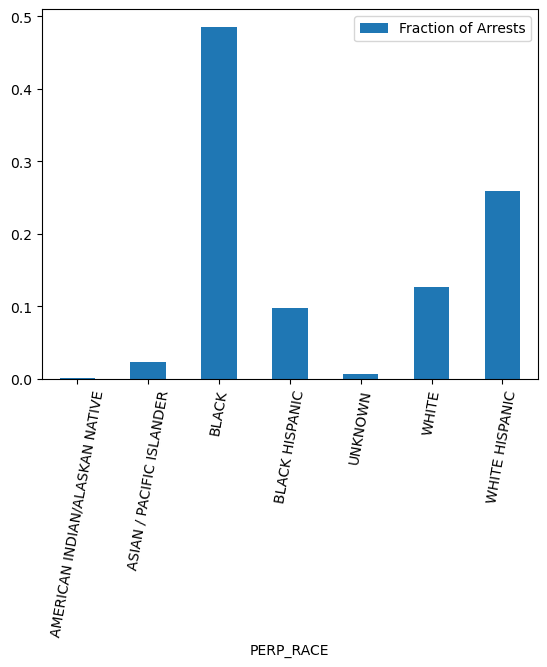

In [19]:
race_frac = drug_arrests.groupby('PERP_RACE').sum()/drug_arrests['Number of Arrests'].sum()
race_frac = race_frac.reset_index(level = 0)
race_frac = race_frac.rename(columns={"Number of Arrests": "Fraction of Arrests"}) 
print(race_frac)
plot6 = race_frac.plot.bar(x = 'PERP_RACE', rot = 0)
plt.xticks(rotation = 80)
plt.show()

Based on our calculations, it appears that White Hispanic people are nearly 2 times more likely to be arrested for a drug-related crime than White people, and Black people are nearly are nearly 4 times more likely to be arrested for a drug-related crime than White people. Because drug use across White people, Black people, and White Hispanic people has historically differed by no more than three percentage points, it is highly unlikely that this difference in proportions for each race is due to population differences. Rather, this racial disparity may be due to other forces, such as police officer biases and discrimination.

__Evaluation of Significance__:
<br>
<br>
While conducting linear and logistic regressions for our data analysis section, we calculated p-values for our coefficient values. While those values did indicate to us whether our results were significant or not, we also wanted to bootstrap our data, to generate confidence intervals for our coefficients.

Bootstrapping for our first research question: In New York City, are the number of arrests negatively correlated with a violent crime?

const                0.104636
Number of Arrests    0.396051
dtype: float64


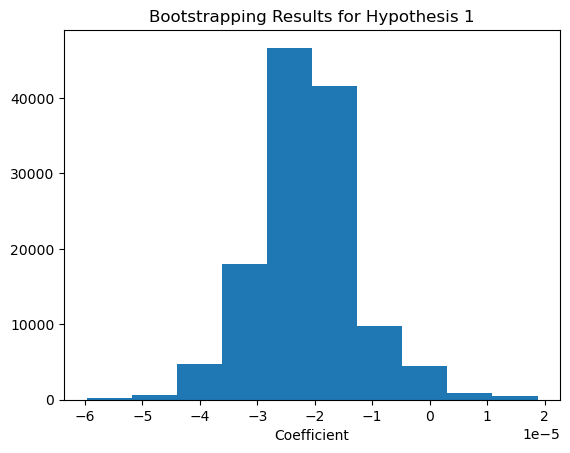

In [27]:
print(smlog.pvalues)
bs_coef= np.zeros(1000)
for i in range(1000):
    bs_samp = arrests_over_time_2.sample(n = arrests_over_time_2.shape[0], replace = True)
    model = LogisticRegression().fit(bs_samp[['Number of Arrests']], bs_samp[['if_violent']].values.ravel())
    bs_coef[i] = model.coef_

plt.hist(bs_coef, density = True)
plt.title('Bootstrapping Results for Hypothesis 1')
plt.xlabel('Coefficient')
plt.show()

In [28]:
np.percentile(bs_coef, [2.5, 97.5])

array([-3.85155507e-05, -1.25827602e-06])

Previously, we found that the coefficient for Number of  Arrests was -8.661e-06. By resampling 1000 times, we came up with the above histogram. The histogram shows that the mean value for the coefficient is approximately -2e-5, which differs greatly from the result we've found earlier. Another point is that the 95% confidence for this bootstrapping histogram is [-3.85155507e-05, -1.25827602e-06]. Our model's 95% confidence interval was [-2.87e-05,	1.13e-05]. We see that these confidence interval values are very different, suggesting that our model worked with poor accuracy. Furthermore, to accept/reject our hypothesis and analyze more of the model's accuracy, we can again look at the p-values, printed above. Our linear regression model's p-value is 0.396051, so it is highly unlikely that our coefficient was generated under a null hypothesis. Additionally, a p-value of 0.05 or lower is considered to be statistically significant in general. So, looking at our results from bootstrapping and at our p-value, we can conclude that our results are statistically insignificant. We thus must reject our alternate hypothesis that in New York City, the number of arrests are negatively correlated with a violent crime.

Bootstrapping for our second research question: If the number of drug-related arrests in New York City decreases, will the number of arrests for people in NYC aged 18-24 also decrease?

const                     1.147364e-04
Number of Drug Arrests    9.670820e-09
dtype: float64


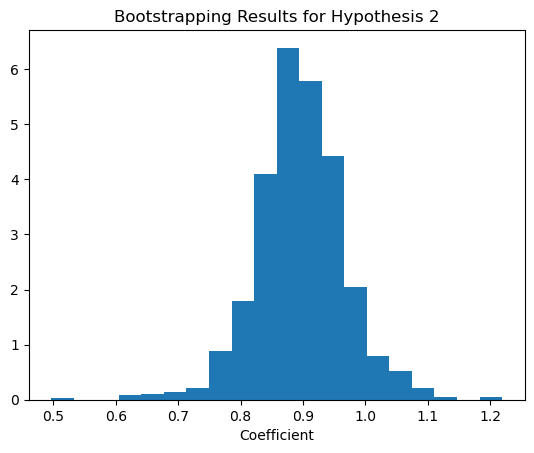

In [29]:
print(model2.pvalues)

bs_coef1= np.zeros(1000)
for i in range(1000):
    bs_samp = combined.sample(n = combined.shape[0], replace = True)
    model = LinearRegression().fit(bs_samp[['Drug Arrests']], bs_samp[['18-24 Arrests']])
    bs_coef1[i] = model.coef_
plt.hist(bs_coef1, density = True, bins = 20)
plt.title('Bootstrapping Results for Hypothesis 2')
plt.xlabel('Coefficient')
plt.show()

In [30]:
np.percentile(bs_coef1, [2.5, 97.5])

array([0.75384254, 1.04912266])

In a previous section, we found that the coefficient for Number of Drug Arrests was 0.8979. By resampling 1000 times, we came up with the above histogram. The histogram's distribution is normal-like and this implies that out bootstrap is reliable. The histogram shows that the mean value for the coefficient is approximately 0.9, which is very close to the result we found earlier. Another point is that the 95% confidence for this bootstrapping histogram is [0.75384254, 1.04912266]. Our model's 95% confidence interval was [0.757, 1.039]. We see that these confidence interval values are very similar, suggesting that our model worked with good accuracy. Furthermore, to accept/reject our hypothesis and analyze more of the model's accuracy, we can again look at the p-values, printed above. Our linear regression model's p-value is 0.00000000967, so it is highly unlikely that our coefficient was generated under a null hypothesis. Additionally, a p-value of 0.05 or lower is considered to be statistically significant in general. So, looking at our results from bootstrapping and at our p-value, we can conclude that our results are statistically significant. We can accept our alternate hypothesis that as number of drug arrests decrease, the number of arrests for people aged 18-24 in NYC decreases as well.

Bootstrapping for our third research question: Is race a significant factor in whether or not a perpetrator will get arrested by the NYPD?

const    0.055784
x1       0.643782
x2       0.711443
x3       0.244904
x4       0.248235
x5       0.160999
x6       0.115853
x7       0.007545
dtype: float64


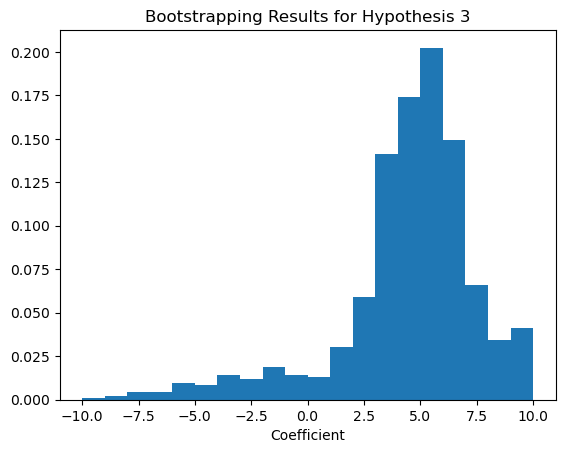

In [31]:
print(model3.pvalues)
bs_coef2= np.zeros(1000)
for i in range(1000):
    bs_samp = new_race.sample(n = combined.shape[0], replace = True)
    y3 = bs_samp['y1']
    X1 = bs_samp[['x1', 'x2', 'x3', 'x4','x5','x6','x7']]
    X1 = sm.add_constant(X1)
    model = sm.OLS(y3,X1).fit()
    bs_coef2[i] = model.params['x7']
plt.hist(bs_coef2, range=[-10, 10], density = True, bins = 20)
plt.title('Bootstrapping Results for Hypothesis 3')
plt.xlabel('Coefficient')
plt.show()

In [32]:
np.percentile(bs_coef2, [2.5, 97.5])

array([-7.65278696, 23.72800753])

In a previous section, we found that the only significant coefficient for the Number of Arrests was 4.8607. By resampling 1000 times, we came up with the above histogram. The histogram's distribution is normal-like and this implies that out bootstrap is reliable. The histogram shows that the mean value for the coefficient is approximately 3.75, which is close to the result we found earlier. However, the 95% confidence interval for this bootstrapping histogram is [-7.65278696, 23.72800753]. Our model's 95% confidence interval was [1.849, 7.872], so our model may not be the most accurate. On the other hand, to accept/reject our hypothesis and analyze more of the model's accuracy, we can again look at the p-values, printed above. Our linear regression model's p-value is 0.007545, so it is unlikely that our coefficient was generated under a null hypothesis, as it is lower than 0.05, the p-value of considered to be statistically significant in general. Furthermore, our coefficient, 4.8607, is still well within our bootstrapping 95% confidence interval, and is relatively close to our histogram's mean. So, looking at our results from bootstrapping and at our p-value, we can tentatively conclude that our results are statistically significant. We will accept our alternate hypothesis that race is a significant factor in whether or not a perpetrator will get arrested by the NYPD, but more analysis may be done to generate a more accurate model.

__Interpretation and Conclusions:__
<br> To conclude, we were able to accept our hypothesis that as the number of drug-related arrests in New York City decreases, the number of arrests for people in NYC aged 18-24 will also decrease, and we also conditionally accepted the second hypothesis, that race is a significant factor in whether or not a perpetrator will get arrested by the NYPD. While we found races such as White were not significant, other races such as White Hispanic did have a significant effect on the number of total NYPD arrests in a certain year. Furthermore, we rejected our hypothesis that the number of NYPD arrests are negatively correlated with a violent crime. 
<br><br>
Researching drug arrests among adults further for our first hypothesis, we've found that overall, drug arrests have decreased over the past ten years. However, while drug arrests have fallen for all young adults, racial disparities remain pronounced. The Pew Charitable True states that in 2019, Black people made up 12% of the U.S. adult population, but made up more than twice that amount of drug-related arrests. Thus, more future analyses could be done on whether race is a significant factor in drug-related arrests, specifically. Since our first hypothesis also reflects a decrease in number arrests for people in aged 18-24, we can assume that young adults usage of drugs may be declining. Another significant factor may be the legalization of marijuana in New York State, which happened in 2021.
<br><br>
Lastly, since many of our analyses concentrated on highlighting the demographics of New York City crime perpetrators, future analyses could be done to quantify the racial and gender biases that may or may not be present in our NYPD arrest data. While we ran a linear regression on the total number of NYPD arrests for different races, it may be interesting to examine the relationship between gender and NYPD's arrest data. 

__Data Limitations:__ 
<br><br>
It must be acknowledged that our county_crime dataset is not indicative of the actual crimes committed in New York State, as many crimes happen, but not all are reported. Recent studies from the Pew Research Center (https://www.pewresearch.org/fact-tank/2020/11/20/facts-about-crime-in-the-u-s/) have shown that auto theft is the most likely crime to reported in the U.S. (at a rate of around 80%). Thus, our county_crime data may be represented by a disproportionally high number of property crimes. And among violent crimes, crimes such as sexual assault are reported at significantly lower rates (around 30%) compared to crimes such as  aggravated assault, which is the most likely violent crime to be reported to law enforcement (at a rate of around 50%). Additionally, White people are significantly more likely to call the police to report a crime (https://counciloncj.foleon.com/policing/assessing-the-evidence/policing-by-the-numbers/). As a result, the crimes committed in locations with a high population of minorities may not be fully represented by our county_crime dataset.
<br><br>
Our nypd_arrests dataset contains similiar limitations. Not all reported crimes are solved or lead to an arrest, so differences between the county_crime and nypd_arrests dataset are inevitable, making it difficult to combine the two datasets into a sensible common dataset. For example, in the U.S., murder is the most likely crime to be solved, while auto theft, the most reported crime, is not as likely to be solved as aggrevated assault and robbery (https://www.pewresearch.org/fact-tank/2020/11/20/facts-about-crime-in-the-u-s/). Furthermore, there has traditionally been a disparity between Black and White arrest rates for violent crimes and drug offenses, with Black people remaining far more likely to be arrested for violent and drug offenses than White people (https://counciloncj.foleon.com/policing/assessing-the-evidence/policing-by-the-numbers/). Our nypd_arrests dataset consists of only basic information about the arrests, and lacks information regarding officers or the motivations/possible racial biases behind the arrests.

__Source Code:__ 

https://github.com/ashleyzeng/info_2950_finalproject
<br> Note that our data cleaning appendix has been uploaded to GitHub.

__Acknowledgments:__<br>
<br> Links to the resources we referenced while preparing this report are listed below.

https://en.wikipedia.org/wiki/New_York_City

https://www.nber.org/digest/jan03/what-reduced-crime-new-york-city

https://www.bloomberg.com/graphics/2022-is-nyc-safe-crime-stat-reality/?sref=SCKvL4TY

https://www.cnn.com/2022/04/14/opinions/new-york-city-subway-shooting-police-1980s-callan

https://www.roselegalservices.com/what-drug-charges-are-most-common/

https://innocenceproject.org/racial-disparities-in-nyc-arrest-data-marijuana-possession/#:~:text=Ninety%2Dthree%20percent%20of%20the,people%20and%201%2C621%20Latino%20people

https://innocenceproject.org/racial-disparities-in-nyc-arrest-data-marijuana-possession/#:~:text=Ninety%2Dthree%20percent%20of%20the,people%20and%201%2C621%20Latino%20people

https://www.samhsa.gov/data/sites/default/files/reports/rpt35326/2021NSDUHSUChartbook102221B.pdf

https://predictivehacks.com/how-to-create-heatmap-on-a-map-in-python/